<h1 align='center'>Alzheimer's Disease Stage Prediction Using Brain MRI Images</h1>

This notebook builds an image classifier using Tensorflow 2.0 and Tensorflow Hub.

<p align='center'>
  <img src='https://static.scientificamerican.com/sciam/cache/file/5D75774D-B12D-4D87-8770F49C15DD3BCC_source.jpg?w=590&h=800&D0A1E720-5465-4BBC-B7CCB7D279301960' height='300px' width='500px'>
</p>

Image Source: <a href='https://www.scientificamerican.com/article/a-portable-mri-makes-imaging-more-democratic/'>Link</a>


## 1. Problem ✅
Alzheimer's  Disease (AD) is a complicated neurodegnerative disorder with an eclectic range of possible biomarkers, each having its own variability across metrics such as demographics, age, sex, etc....

> "Alzheimer’s disease is an irreversible, progressive brain disorder that slowly destroys memory and thinking skills and, eventually, the ability to carry out the simplest tasks. In most people with Alzheimer’s, symptoms first appear in their mid-60s. Alzheimer’s disease is the most common cause of dementia among older adults."

<p align='center'>
  <img src='https://www.alzheimersla.org/wp-content/uploads/2021/04/Understanding-Memory-Loss-Alzheimers-disease-the-basics.jpg.png' height='200px'>
</p>

For more information about AD, please refer to this <a href='https://www.alz.org/alzheimers-dementia/what-is-alzheimers'>link</a> for a quick overview!


Neurodegeneration is a critical component of AD so being able to predict the signatures of neuronal damage by using structural changes detected by an MRI machine would help us inform of a treatment window to prevent further cognitive / memory loss.

Future:
* Apply this methodology to different diseased brains ie. multiple sclerosis or Parkinson's and compare the readout.

## 2. Data ✅
The data is acquired from Kaggle: <a href='https://www.kaggle.com/datasets/tourist55/alzheimers-dataset-4-class-of-images/'>Link here!</a>

More information about the data:
> The data is split into training (`train`) and testing (`test`) directories. Which are split into 4 sub directories
> 1. `Mild Demented` (Training: 717 files | Testing: 179 files) -> Relabeled to `Level_2_Dementia`
> 2. `Moderate Demented` (Training: 52 files | Testing: 12 files) -> Relabeled to `Level_3_Dementia`
> 3. `Non Demented` (Training: 2560 files | Testing: 640 files) -> Relabeled to `Level_0_Dementia`
> 4. `Very Mild Demented` (Training: 1792 files | Testing: 448 files) -> Relabeled to `Level_1_Dementia`

The one thing I did notice is the class imbalances (less images in the `Moderate Dementia` category). *Note: I only took 400 images (or 52 in the Moderate group) for each of the categories in the training images, and took 10 images each for testing. In the future, I will train the entire dataset, but for now as a preliminary analysis, I will only look at this subset*

> Dataset consists of two files - Training and Testing both containing a total of around ~5000 images each segregated into the severity of Alzheimer's

> Note. An fMRI image is usually a 3 dimensional z-stacked image of the whole brain. Here we will only be looking at a specific region (similar in all patients) for helping us to account for the regional bias.

## 3. Evaluation ✅

Seeing how accurate our model is in identifying regions of high structural change between images.

> **Note** This is still a work in progress. The model still needs to be optimized!

## 4. Features ✅

* Custom images were images found on the internet with similar MRI images but with different disease outcomes.

## Table of Contents
1. [Data Preparation](#1)
2. [Data Processing](#2)
3. [Visualizations](#3)
4. [Modeling](#4)
5. [Making and Evaluating Predictions using Trained Model](#5)
6. [Saving and Loading a Trained Model](#6)
7. [Conclusion](#7)

In [122]:
# import Tensorflow into Colab
import tensorflow as tf
print('TF Version:', tf.__version__)

# importing Tensorflow Hub
import tensorflow_hub as hub
print('Tensorflow hub:', hub.__version__)

# check for GPU availability
print('GPU/TPU',
      'available' if tf.config.list_physical_devices('GPU') or tf.config.list_physical_devices('TPU')  else 'not available')

TF Version: 2.13.0
Tensorflow hub: 0.14.0
GPU/TPU available


# 1. Data Preparation <a name='1'>
## Getting our Data ready (Turning it into Tensors)

With all ML models, our data has to be in numerical format.
* Turning our images into Tensors (numerical representations)

Lets start by accessing our data and checking the `labels.csv` which contains the labels for each image

In [123]:
# Importing the relevant libraries:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import Image
import os

In [124]:
# Checkout the labels of the data
main_dir_path = '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction'
training_labels_path = main_dir_path + '//' + 'training_labels.csv'
labels_csv = pd.read_csv(training_labels_path, delimiter = ',')
labels_csv.head()


,ID,Condition
0,mildDem0,Level_2_Dementia
1,mildDem1,Level_2_Dementia
2,mildDem2,Level_2_Dementia
3,mildDem3,Level_2_Dementia
4,mildDem4,Level_2_Dementia


In [282]:
labels_csv.describe()

,ID,Condition
count,1244,1244
unique,1244,4
top,mildDem0,Level_2_Dementia
freq,1,401


In [126]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1244 entries, 0 to 1243
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ID         1244 non-null   object
 1   Condition  1244 non-null   object
dtypes: object(2)
memory usage: 19.6+ KB


In [127]:
labels_csv.head(10)

,ID,Condition
0,mildDem0,Level_2_Dementia
1,mildDem1,Level_2_Dementia
2,mildDem2,Level_2_Dementia
3,mildDem3,Level_2_Dementia
4,mildDem4,Level_2_Dementia
5,mildDem5,Level_2_Dementia
6,mildDem6,Level_2_Dementia
7,mildDem7,Level_2_Dementia
8,mildDem8,Level_2_Dementia
9,mildDem9,Level_2_Dementia


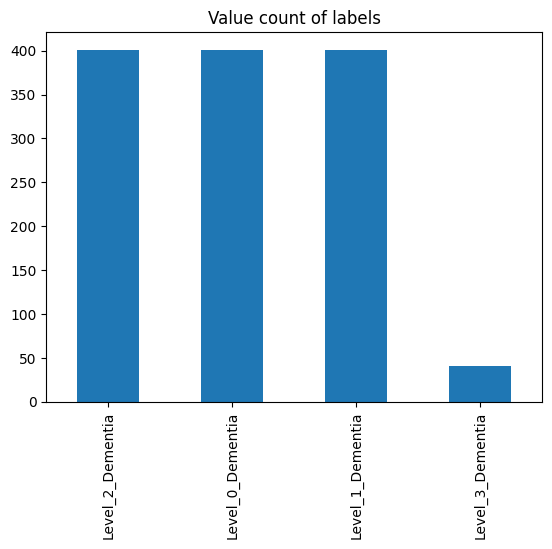

In [128]:
# storing the label columns as a list
label_columns = list(labels_csv.columns)

labels_csv['Condition'].value_counts().plot(kind = 'bar')
plt.title('Value count of labels');

### Getting images and their labels

Lets get a list of all image file pathnames

In [129]:
# validation of training_labels.csv to actual files in dir
real_names = [fname for fname in os.listdir('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/')]
real_df = pd.DataFrame(real_names)
real_df.to_csv('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/real_names.csv')

In [130]:
# Create pathnames from image ID's
filenames = ['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/' + fname + '.jpg' for fname in labels_csv['ID']]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem0.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem4.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem5.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem9.jpg']

In [131]:
# check whether number of filenames matches number of actual image files
if len(os.listdir('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/')) == len(filenames):
  print('Filenames match actual amount of files')
else:
  print('Filenames do not match actual amount of files')

Filenames match actual amount of files


In [132]:
len(os.listdir('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/')), len(filenames)

(1244, 1244)

Since we got our training image filepaths in a list, let's prepare our labels.

In [133]:
labels = labels_csv['Condition']
labels = np.array(labels)
labels

array(['Level_2_Dementia', 'Level_2_Dementia', 'Level_2_Dementia', ...,
       'Level_1_Dementia', 'Level_1_Dementia', 'Level_1_Dementia'],
      dtype=object)

In [134]:
unique_targets = np.unique(labels)
unique_targets[:10]

array(['Level_0_Dementia', 'Level_1_Dementia', 'Level_2_Dementia',
       'Level_3_Dementia'], dtype=object)

In [135]:
len(unique_targets)

4

Here we will be turning a single label into an array of booleans (as a test), and after we will turn every label into a boolean array)

In [136]:
# 1. turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_targets

Level_2_Dementia


array([False, False,  True, False])

In [138]:
# turn every label into a boolean array
boolean_labels = [label == unique_targets for label in labels]
boolean_labels[:10]

[array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False])]

In [139]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_targets == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

Level_2_Dementia
(array([2]),)
2
[0 0 1 0]


## Creating our Own Validation Set

In [140]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [141]:
X[:5]

['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem0.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem4.jpg']

In [142]:
y[:5]

[array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False,  True, False])]

**BUT FIRST** We're going to experiment with ~ 40 images per condition then increase sample size after some testing

In [143]:
# Set number of images to use for experimenting
NUM_IMAGES = 40 #@param {type:'slider', min:1, max:355, step: 1}

In [144]:
# randomly sampling the training_images
sampled_labels_csv = labels_csv.groupby('Condition').sample(n=NUM_IMAGES, random_state=42).sample(80, random_state=42)
sampled_X = ['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/' + fname + '.jpg' for fname in sampled_labels_csv['ID']]
sampled_y = [label == unique_targets for label in sampled_labels_csv['Condition']]

In [145]:
# creating a list of file names from a randomly sampled ID using the NUM_IMAGES
sampled_X[:10]

['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem204.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem247.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/moderateDem30.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/verymildDem67.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem156.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem104.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem315.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/verymildDem341.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem210.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/moderateDem23.jpg']

In [146]:
sampled_y[:10]

[array([False, False,  True, False]),
 array([False, False,  True, False]),
 array([False, False, False,  True]),
 array([False,  True, False, False]),
 array([False, False,  True, False]),
 array([ True, False, False, False]),
 array([False, False,  True, False]),
 array([False,  True, False, False]),
 array([False, False,  True, False]),
 array([False, False, False,  True])]

In [147]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and val of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(sampled_X,
                                                  sampled_y,
                                                  test_size = 0.25,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(60, 60, 20, 20)

# 2. Data Processing <a name='2'>
## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we’re going to write a function that:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our image (A jpg) into Tensors
4. Resize our `image` to be a shape of (224, 224)

5. Return our modified `image`


In [148]:
# convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(208, 176)

In [149]:
tf.constant(image)

<tf.Tensor: shape=(208, 176), dtype=uint8, numpy=
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)>

In [150]:
# Define the image size:
IMG_SIZE = 224

# Create a function for preprocessing images:
def process_image(image_path):
  '''
  Takes an image file path and turns the image into a tensor
  '''
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical tensor with 3 color channels (R, G , B)
  image = tf.image.decode_jpeg(image, channels=3)
  # Covert the color channel values from 0-255 to 0-1 values  (normalizing the image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

### Testing our the components of the function above

In [151]:
# tensor = tf.io.read_file(filenames[26])
# tensor

In [152]:
# tensor = tf.image.decode_jpeg(tensor, channels=3)

In [153]:
# tf.image.convert_image_dtype(tensor, tf.float32 )

## Turning our Data into Batches

Creating a tuple of tensors: `(image, label)`

In [154]:
# creating a function to return the tuple of tensors:
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image , label)
  '''
  image = process_image(image_path)
  return image, label

In [155]:
# Define the batch size (start with 32):
BATCH_SIZE = 32

# Create a function that turns data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels)
  '''
  # IF the data is test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no label)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating Validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print('Creating training data batches...')
    # turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping the image processor function is faster way
    data = data.shuffle(buffer_size = len(X))

    # create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # turn into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [156]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating Validation data batches...


In [157]:
# Check our the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 4), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 4), dtype=tf.bool, name=None)))

# 3. Visualizations <a name='2'>
## Visualizing Data Batches



In [158]:
# create a function for viewing images in a data batch
def show_20_images(images, labels):
  '''
  Displays a plot of 10 images and their labels from a data batch
  '''

  # Set up figure
  plt.figure(figsize = (15,12))
  # loop through 20( for displaying 20 images)
  for i in range(20):
    # create subplots (5 row, 4 columns)
    ax = plt.subplot(5,4, i + 1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_targets[labels[i].argmax()])
    # turn the grid lines off
    plt.axis('off')
  plt.tight_layout();


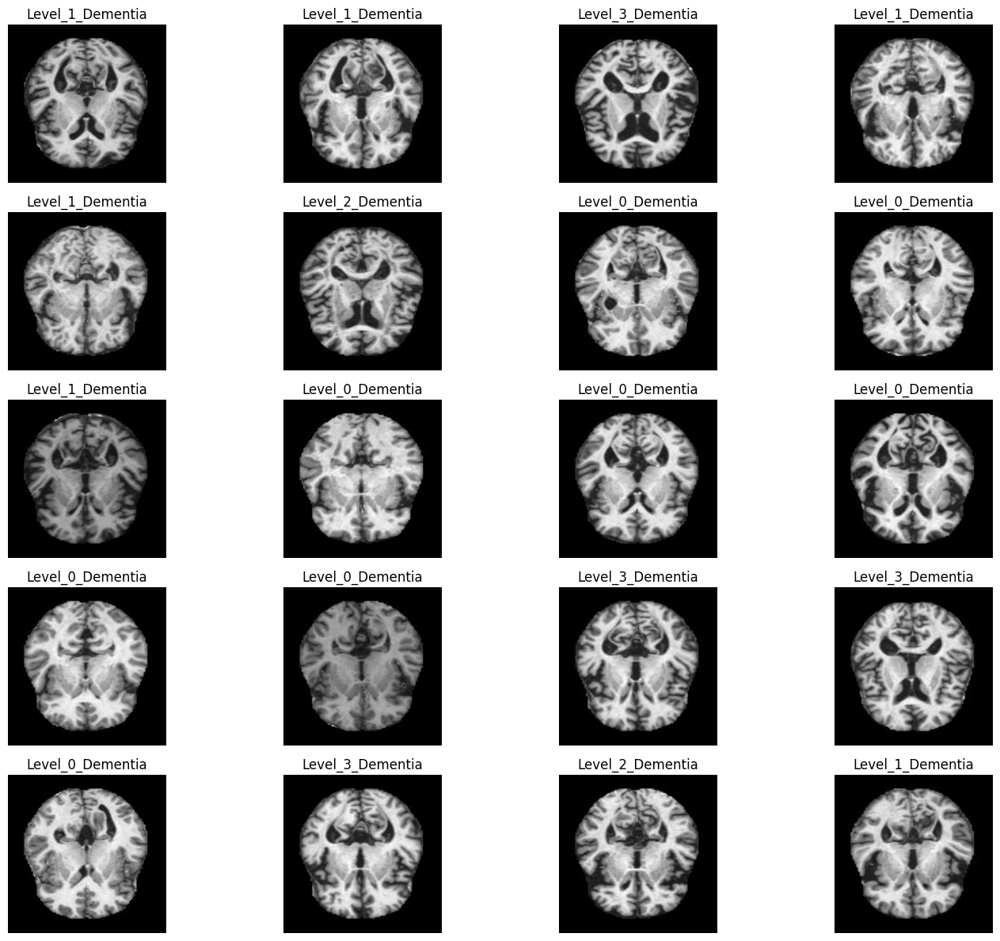

In [159]:
# Let's visualize the data in our training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_20_images(train_images, train_labels)

In [160]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.bool, name=None))>

In [161]:
len(train_labels)


32

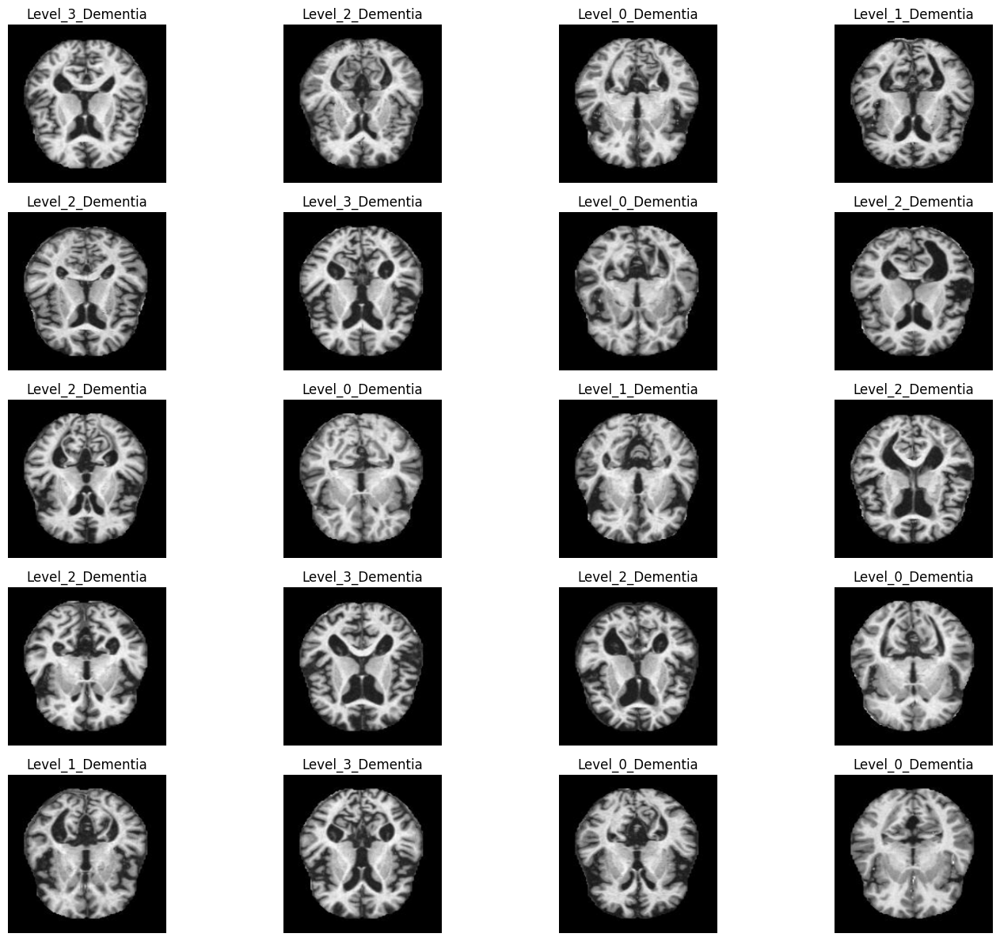

In [162]:
# Now lets visualize the validation dataset
val_images, val_labels = next(val_data.as_numpy_iterator())
show_20_images(val_images, val_labels)

# 4. Modeling <a name='4'>
## Building a Model:

## More Information about the Model: EfficientNet_V2

The link to the model used is here: https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2

Details:
1. Input size: 240x240px
2. Trained on imagenet-21k (Full ImageNet, Fall 2011 release)

> EfficientNet V2 are a family of image classification models, which achieve better parameter efficiency and faster training speed than prior arts.

<p align='center'>
  <img src='https://www.gstatic.com/aihub/tfhub/efficientnetv2_images/train_params.png' height='500px'>
</p>


In [163]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, heigh, width, color channels

# Setup output shape
OUTPUT_SHAPE = len(unique_targets)

# Setup model URL from TensorFlow Hub: Using an EfficientNet V2 Model
MODEL_URL = 'https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2'

## Building Keras Model


In [164]:
# Create a function which builds the Keras Model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input Layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output Layer)
      ])
  # compile the model:
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model

In [165]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1280)              6931124   
                                                                 
 dense_3 (Dense)             (None, 4)                 5124      
                                                                 
Total params: 6936248 (26.46 MB)
Trainable params: 5124 (20.02 KB)
Non-trainable params: 6931124 (26.44 MB)
_________________________________________________________________


## Creating Callbacks

### TensorBoard Callbacks

In [166]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [167]:
import datetime

# creates function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard log
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/log',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [168]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= 'val_accuracy',
                                                  patience = 3)

## Training a Model (on a subset of our data)

In [169]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:355, step: 1}

In [170]:
# check to make sure we are running on a GPU

print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not availablee')

GPU available


Let's Create the function which trains the model:

In [171]:
# build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # create a model
  model = create_model()

  # create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # return fitted model
  return model

In [172]:
# fit model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2
Epoch 1/100
2/2 [==============================] - 21s 6s/step - loss: 2.1131 - accuracy: 0.3000 - val_loss: 1.4784 - val_accuracy: 0.4000
Epoch 2/100
2/2 [==============================] - 0s 227ms/step - loss: 1.5004 - accuracy: 0.3167 - val_loss: 1.4345 - val_accuracy: 0.2500
Epoch 3/100
2/2 [==============================] - 0s 187ms/step - loss: 1.4882 - accuracy: 0.3167 - val_loss: 1.4976 - val_accuracy: 0.3000
Epoch 4/100
2/2 [==============================] - 0s 226ms/step - loss: 1.4586 - accuracy: 0.3167 - val_loss: 1.3260 - val_accuracy: 0.4000


### Checking the tensorboard logs



In [49]:
# rm -rf ./logs/

In [50]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/ALZ_Brain_Prediction/log

<IPython.core.display.Javascript object>

# 5. Making and evaluating predictions using trained model <a name='5'>

In [173]:
# make predictions on the validation data
predictions = model.predict(val_data, verbose = 1 )
predictions

1/1 [==============================] - 1s 962ms/step


array([[0.27243418, 0.08848504, 0.504951  , 0.13412975],
       [0.4075553 , 0.30469918, 0.19340596, 0.09433959],
       [0.3600365 , 0.31192124, 0.17324854, 0.15479378],
       [0.3293496 , 0.34164405, 0.2615087 , 0.06749765],
       [0.5381799 , 0.08332978, 0.30363187, 0.07485846],
       [0.405682  , 0.16874056, 0.21053715, 0.21504027],
       [0.33380362, 0.18027009, 0.40768906, 0.07823717],
       [0.35415864, 0.08523701, 0.45234126, 0.10826307],
       [0.6250109 , 0.11381822, 0.18875498, 0.07241581],
       [0.35790005, 0.32345933, 0.25234246, 0.06629816],
       [0.4235388 , 0.31829435, 0.1714551 , 0.0867117 ],
       [0.30254072, 0.13851464, 0.47318497, 0.08575965],
       [0.46275163, 0.17316517, 0.23190634, 0.1321769 ],
       [0.58147883, 0.0650905 , 0.21535845, 0.13807224],
       [0.63165337, 0.10546067, 0.15216371, 0.11072227],
       [0.42325002, 0.27270615, 0.23508354, 0.06896028],
       [0.52448326, 0.15031402, 0.20006089, 0.12514187],
       [0.5179295 , 0.15436514,

In [174]:
predictions.shape

(20, 4)

In [175]:
len(predictions[0])

4

In [176]:
np.sum(predictions[0])

1.0

In [177]:
# First prediction
index = 5
print(predictions[0])
print(f'Max value (probability of prediction): {np.max(predictions[0])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {unique_targets[np.argmax(predictions[index])]}')

[0.27243418 0.08848504 0.504951   0.13412975]
Max value (probability of prediction): 0.504951000213623
Sum: 0.9999999403953552
Max index: 0
Predicted Label: Level_0_Dementia


In [178]:
# turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of prediction probabilities into a label.
  '''
  return unique_targets[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[1])
pred_label

'Level_0_Dementia'

In [179]:
# Create a function to unbatch a batched dataset
def unbatchify(data, test_data = False):
  '''
  Turning our batched dataset of (image, label) Tensors into a unbatched iterable
  '''
  images = []
  labels = []
  if test_data:
    # loop through unbatched data ONLY return images
    for image in data.unbatch().as_numpy_iterator():
      images.append(image)
    return images
  else:
    # loop through unbatched data (training and validation)
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_targets[np.argmax(label)])

    return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[1], val_labels[1]

(array([[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]], dtype=float32),
 'Level_2_Dementia')

In [180]:
def plot_pred(prediction_probabilities, labels, images, n =1):
  '''
  View the prediction, ground truth, and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image and remove ticks
  plt.imshow(image)
  plt.axis('off')

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # change plot title to be predicted, probability of prediction and truth label
  plt.title(f'Predicted Label: {pred_label} \n Predicted Probability {np.max(pred_prob)*100:2.0f}% \n True Label {true_label}',
            color = color)

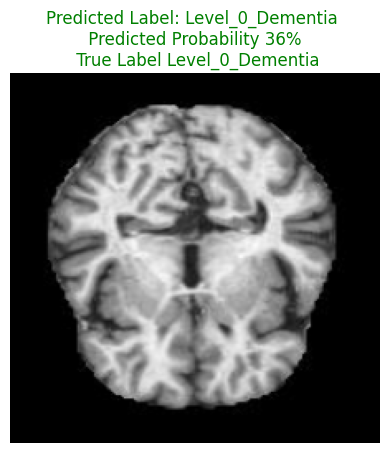

In [181]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n=9)

### Making a function to get the top 10 predictions

In [182]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the top 10 prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indices
  top10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top10_pred_values = pred_prob[top10_pred_indices]

  # Find the top 10 prediction labels
  top10_pred_labels = unique_targets[top10_pred_indices]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top10_pred_labels)),
                               top10_pred_values,
                               color = 'grey')
  plt.xticks(np.arange(len(top10_pred_labels)),
             labels = top10_pred_labels,
             rotation = 'vertical')
  # Change the color of true label
  if np.isin(true_label, top10_pred_labels):
    top_plot[np.argmax(top10_pred_labels == true_label)].set_color('green')
  else:
    pass

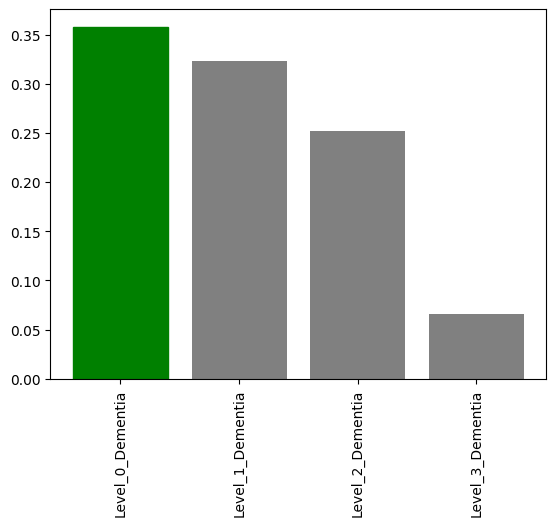

In [183]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = 9)

In [184]:
# creating a function for checking our predictions:
def checking_predictions(pred_value, pred_labels, pred_images, i_multiplier=1, num_rows = 4, num_cols = 2):
  i_multiplier = 1
  num_rows = 4
  num_cols = 2
  num_images = num_rows * num_cols
  plt.figure(figsize = (10*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=pred_value,
              labels = pred_labels,
              images = pred_images,
              n = i + i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=pred_value,
                  labels = pred_labels,
                  n=i+i_multiplier)

  plt.tight_layout(h_pad=1.0)
  plt.show()

Checking the predictions for the validation data

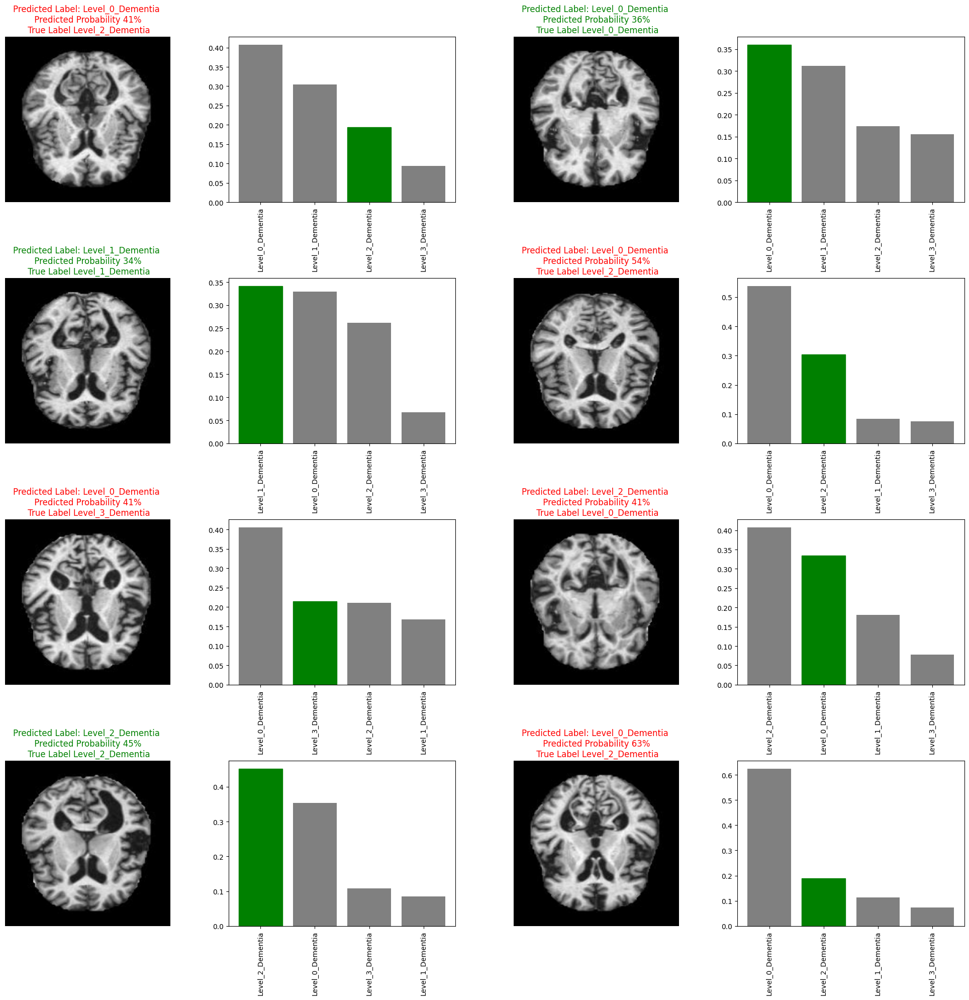

In [185]:
checking_predictions(predictions, val_labels, val_images)

**NOTE** There is a fair bit of error when only trained on less than half of the full dataset. Next we will be training this model on a full dataset of 355 images

# 6. Saving and loading a Trained Model <a name='6'>

In [186]:
# create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a 'models' directory and appends a suffix (string).
  '''
  # create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + '_' + suffix+'.h5' # save format of model
  print(f'saving model to: {model_path}')
  model.save(model_path)
  return model_path

In [187]:
# Create a function to load a trained model:
def load_model(model_path):
  '''
  Load a saved model from a specified path.
  '''
  print(f'Loading saved model from {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer':hub.KerasLayer})
  return model

Testing our saving/ loading function

In [188]:
# Save our model trained on 50 images
save_model(model, suffix = 'prelim_trained_images-efficientnetv2-adam')

saving model to: /content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-055154_prelim_trained_images-efficientnetv2-adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-055154_prelim_trained_images-efficientnetv2-adam.h5'

In [189]:
prelim_loaded_model = load_model('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-055154_prelim_trained_images-efficientnetv2-adam.h5')

Loading saved model from /content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-055154_prelim_trained_images-efficientnetv2-adam.h5


In [71]:
# Evaluate the pre-saved model
model.evaluate(val_data)

1/1 [==============================] - 0s 102ms/step - loss: 0.9508 - accuracy: 0.6000


[0.9508021473884583, 0.6000000238418579]

In [72]:
# Evaluate the loaded model
prelim_loaded_model.evaluate(val_data)

1/1 [==============================] - 1s 1s/step - loss: 0.9508 - accuracy: 0.6000


[0.9508021473884583, 0.6000000238418579]

This confirms that model was saved correctly

## Training our model on the Full Training Dataset

In [190]:
len(X), len(y)

(1244, 1244)

In [192]:
# randomizing sampling
full_sampled_labels_csv = labels_csv.sample(n=1244, random_state=42)
full_sampled_X = ['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/' + fname + '.jpg' for fname in full_sampled_labels_csv['ID']]
full_sampled_y = [label == unique_targets for label in full_sampled_labels_csv['Condition']]

In [193]:
full_sampled_y[:10]

[array([ True, False, False, False]),
 array([False,  True, False, False]),
 array([ True, False, False, False]),
 array([False, False, False,  True]),
 array([ True, False, False, False]),
 array([ True, False, False, False]),
 array([False, False,  True, False]),
 array([ True, False, False, False]),
 array([ True, False, False, False]),
 array([False,  True, False, False])]

In [194]:
full_sampled_X[:10]

['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem339.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/verymildDem306.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem231.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/moderateDem38.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem294.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem240.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/mildDem198.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem100.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/nonDem85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/training_images/verymildDem159.jpg']

In [195]:
full_sampled_labels_csv.head(10)

,ID,Condition
781,nonDem339,Level_0_Dementia
1149,verymildDem306,Level_1_Dementia
673,nonDem231,Level_0_Dementia
439,moderateDem38,Level_3_Dementia
736,nonDem294,Level_0_Dementia
682,nonDem240,Level_0_Dementia
198,mildDem198,Level_2_Dementia
542,nonDem100,Level_0_Dementia
527,nonDem85,Level_0_Dementia
1002,verymildDem159,Level_1_Dementia


In [196]:
full_sampled_labels_csv.describe()

,ID,Condition
count,1244,1244
unique,1244,4
top,nonDem339,Level_0_Dementia
freq,1,401


In [197]:
# Create a databatch with the full dataset:
full_data = create_data_batches(full_sampled_X, full_sampled_y)

Creating training data batches...


In [198]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.bool, name=None))>

In [199]:
# Create a model for full model:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2


In [200]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

In [201]:
print('GPU', 'Available' if tf.config.list_physical_devices('GPU') else 'Not Available')

GPU Available


In [202]:
NUM_EPOCHS = 203 #@param {type:'slider', min:10, max:1000, step: 1}

In [203]:
# fit the model with the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS ,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/203
39/39 [==============================] - 397s 10s/step - loss: 1.3995 - accuracy: 0.3947
Epoch 2/203
39/39 [==============================] - 2s 62ms/step - loss: 0.9781 - accuracy: 0.5249
Epoch 3/203
39/39 [==============================] - 2s 60ms/step - loss: 0.8757 - accuracy: 0.5900
Epoch 4/203
39/39 [==============================] - 2s 61ms/step - loss: 0.8197 - accuracy: 0.6117
Epoch 5/203
39/39 [==============================] - 3s 76ms/step - loss: 0.8024 - accuracy: 0.6367
Epoch 6/203
39/39 [==============================] - 2s 61ms/step - loss: 0.7652 - accuracy: 0.6600
Epoch 7/203
39/39 [==============================] - 2s 60ms/step - loss: 0.7270 - accuracy: 0.6712
Epoch 8/203
39/39 [==============================] - 2s 60ms/step - loss: 0.7123 - accuracy: 0.6760
Epoch 9/203
39/39 [==============================] - 3s 68ms/step - loss: 0.6882 - accuracy: 0.6994
Epoch 10/203
39/39 [==============================] - 3s 74ms/step - loss: 0.6748 - accuracy: 0.695

In [204]:
save_model(full_model, suffix = 'full-model-efficientnetv2-adam')

saving model to: /content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-060331_full-model-efficientnetv2-adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-060331_full-model-efficientnetv2-adam.h5'

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/log

In [205]:
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-060331_full-model-efficientnetv2-adam.h5')

Loading saved model from /content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/models/20230928-060331_full-model-efficientnetv2-adam.h5


## Making Predictions on the Test Dataset

In [220]:
# Load test image filenames:

# 1. importing the test labels csv file
test_labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/test_labels.csv')
test_path = '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/'
random_test_names = test_labels_csv.sample(n=len(test_labels_csv), random_state=42)
test_filenames = [test_path + fname + '.jpg' for fname in random_test_names['ID']]


# get custom image prediction labels
test_pred_labels = [condition for condition in random_test_names['Condition']]
test_filenames[:5], test_pred_labels[:5]

(['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/mildDem480.jpg',
  '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/verymildDem410.jpg',
  '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/verymildDem458.jpg',
  '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/verymildDem461.jpg',
  '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/testing_images/verymildDem426.jpg'],
 ['Level_2_Dementia',
  'Level_1_Dementia',
  'Level_1_Dementia',
  'Level_1_Dementia',
  'Level_1_Dementia'])

In [221]:
len(test_filenames)

311

In [222]:
# Create test data batch:
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches....


In [223]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** This next cell will take a bit of time

In [224]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

10/10 [==============================] - 1s 81ms/step


In [225]:
# Save predictions (NumPy array) to csv file(for access later)
np.savetxt('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/preds_array.csv',
           test_predictions,
           delimiter = ',')

In [226]:
test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/preds_array.csv',
                              delimiter = ',')

In [227]:
test_predictions.shape


(311, 4)

In order to test our model on the `test data` we need to `unbatchify()` it first and get the images and the labels for the test data for which we will assign it as `test_images` and `test_labels`

In [228]:
# unbatchify the test data
test_images = unbatchify(test_data, test_data = True)
test_images[0]

array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       ...,

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]], dtype=float32)

In [229]:
# importing the test predictions file
test_predictions_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/preds_array.csv', header=None)
test_predictions_df.head(10)

,0,1,2,3
0,0.001104,0.010111,0.955022,0.033763
1,0.224818,0.610938,0.163290,0.000954
2,0.107425,0.790754,0.069895,0.031926
3,0.033699,0.383306,0.535014,0.047981
4,0.006174,0.339880,0.108589,0.545357
5,0.032949,0.727322,0.089780,0.149948
6,0.193859,0.492186,0.313627,0.000327
7,0.978287,0.021659,0.000050,0.000005
8,0.000799,0.004315,0.975525,0.019361
9,0.076209,0.868424,0.055182,0.000185


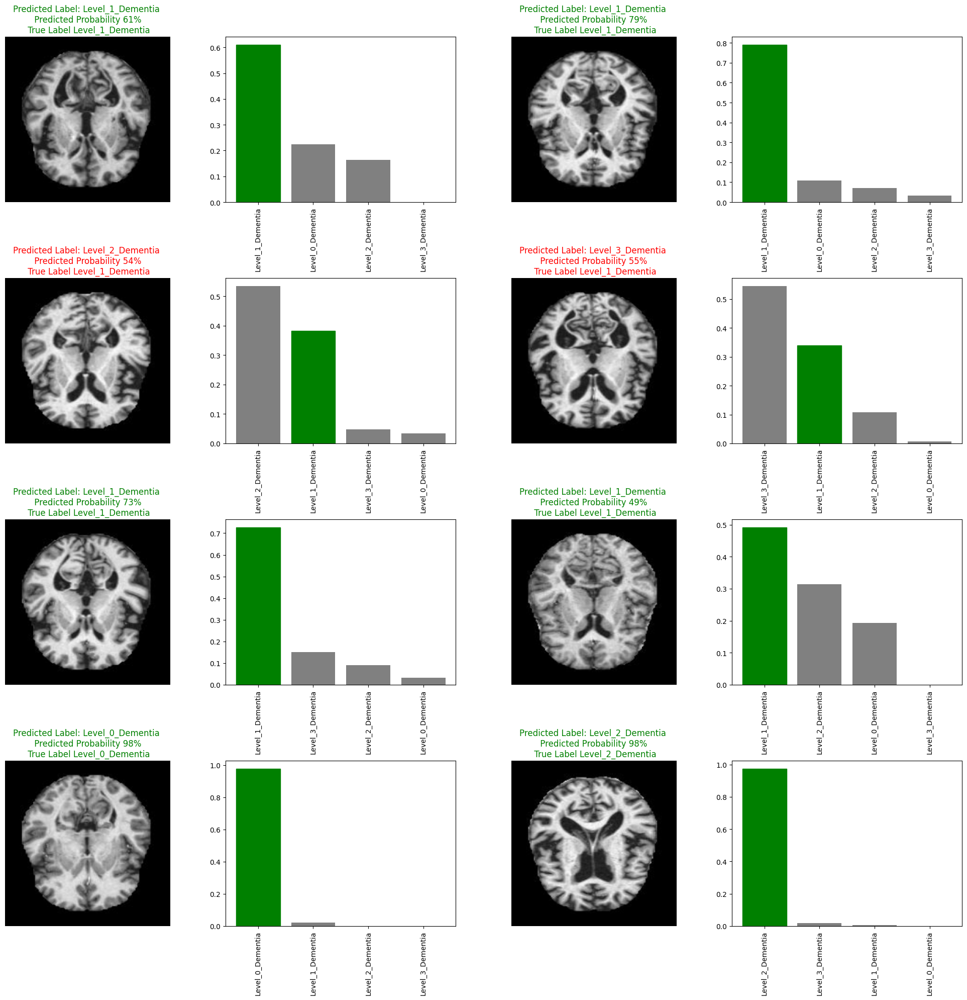

In [230]:
# visualizing test predictions
checking_predictions(test_predictions, test_pred_labels, test_images)

### Making Predictions On Custom Images
---

These custom images are different from the test and training images because these four images are from different models of neurodegeneration.

We will look at:
1. Wernicke-Korsakoff
2. Alcoholic Brain
3. Parkinson's Disease
4, Natural Aging

Although these models of neurocognitive decline is not on the same level as Alzheimer's we can try to compare the level of decline to the level of decline seen in patients with AD.



In [267]:
# get custom image filepaths
custom_path = '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/custom_images'
custom_image_paths = [custom_path + '/' + fname for fname in os.listdir(custom_path)]

In [268]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/custom_images/wernicke_korsakoff.png',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/custom_images/alcoholic_brain.png',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/custom_images/pd_sample_2.png',
 '/content/drive/MyDrive/Colab Notebooks/ALZ_Brain_Prediction/custom_images/aging.png']

In [269]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [270]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 861ms/step


array([[4.8585681e-04, 7.3832279e-01, 2.4017826e-01, 2.1013055e-02],
       [6.9362010e-05, 9.0931863e-01, 8.7952644e-02, 2.6593145e-03],
       [1.4727490e-07, 9.9877971e-01, 1.0760362e-03, 1.4407918e-04],
       [4.8144083e-04, 7.5949496e-01, 7.0873313e-02, 1.6915022e-01]],
      dtype=float32)

In [271]:
custom_preds.shape

(4, 4)

In [272]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['Level_1_Dementia',
 'Level_1_Dementia',
 'Level_1_Dementia',
 'Level_1_Dementia']

In [277]:
# true labels for the images:
true_labels = ['Wernicke Korsakoff', 'alcohlic', 'Parkinsons Disease', 'Natural Aging']

In [278]:
# Get custom images
custom_images = {}
# Loop through the unbatched data
for image, labels in zip(custom_data.unbatch().as_numpy_iterator(), true_labels):
  custom_images[labels] = image

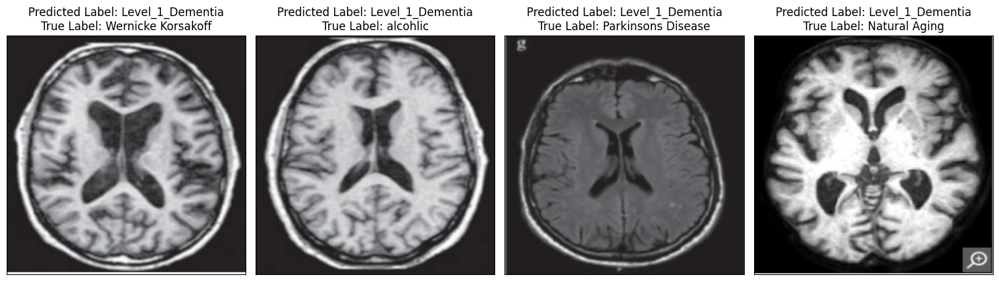

In [281]:
# check custom image predictions
plt.figure(figsize = (15,10))
for i, (label, image) in enumerate(custom_images.items()):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title("Predicted Label: " + custom_pred_labels[i] + "\n" + "True Label: "+ label)
  plt.imshow(image)
plt.tight_layout();

# Conclusion ... for now <a name='7'></a>
* Here In the first trial of creating a ConvNet for image classication of brain from various ages of mice and we achieved `>80%` accuracy with a EfficientNetV2.
* The `loaded_full_model` compared to the `prelim_loaded_model` showed an enormous improvement in accuracy.
* Then as a treat, I fed the model images from patients with different neurodegenerative conditions to compare to the AD dataset.

### Next Steps:
1. Include images from various ages
2. Optimize the model / hyperparameter tuning (Keras Tuner)
3. experiment with different optimizers / image classifiers! (so far used the EfficientNetV2 and MobileNetV2)